# PS5: Optic Flow

In [1]:
# Imports
import cv2 as cv
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from scipy.linalg import block_diag
from sklearn.cluster import KMeans
# Matplotlib params
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['figure.titlesize'] = 24
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'
## Hide axes in plots
show_axis = False
plt.rcParams['xtick.bottom'] = show_axis
plt.rcParams['xtick.labelbottom'] = show_axis
plt.rcParams['ytick.left'] = show_axis
plt.rcParams['ytick.labelleft'] = show_axis
plt.rcParams['axes.spines.left'] = show_axis
plt.rcParams['axes.spines.bottom'] = show_axis
plt.rcParams['axes.spines.top'] = show_axis
plt.rcParams['axes.spines.right'] = show_axis
## Axis labels
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.labelpad'] = 8

## 1. Gaussian and Laplacian Pyramids
### 1.1 Reduce

In [2]:
# load image
yos1 = cv.imread('ps5-descr/images/DataSeq1/yos_img_01.jpg', cv.IMREAD_GRAYSCALE)
yos1 = yos1.astype(float) / 255.0

In [3]:
# define reduce
def reduce(img, level = 1):
    '''reduce the image into half resolution'''
    #reduce filter
    w = np.array([1, 4, 6, 4, 1]) / 16
    for i in range(level):
        img = cv.sepFilter2D(img, -1, w, w)[::2, ::2]
    return img

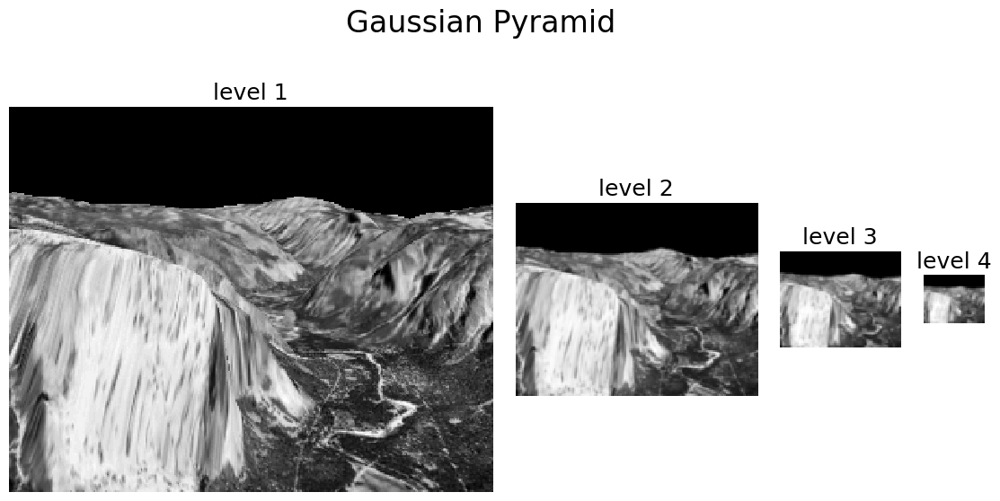

In [4]:
level = 4

fig = plt.figure()
fig.suptitle('Gaussian Pyramid', y =0.9)
gs = gridspec.GridSpec(1, level, width_ratios=[2**i for i in range(level)][::-1], wspace=0.1)

for i in range(level):
    ax = plt.subplot(gs[i])
    # ax.set_anchor('S')
    ax.set_title('level {}'.format(i + 1))
    ax.imshow(reduce(yos1, i), cmap='gray')
    ax.axis('off')
plt.show()


### 1.2 Expand

In [5]:
def expand(img, dstsize = None):
    '''expand the image into double resolution'''
    #expand filter
    w = np.array([1, 4, 6, 4, 1]) / 8
    if dstsize is not None:
        exp = np.zeros(dstsize)
    else:
        exp = np.zeros((2 * img.shape[0], 2 * img.shape[1]))
    exp[::2, ::2] = img
    return cv.sepFilter2D(exp, -1, w, w)




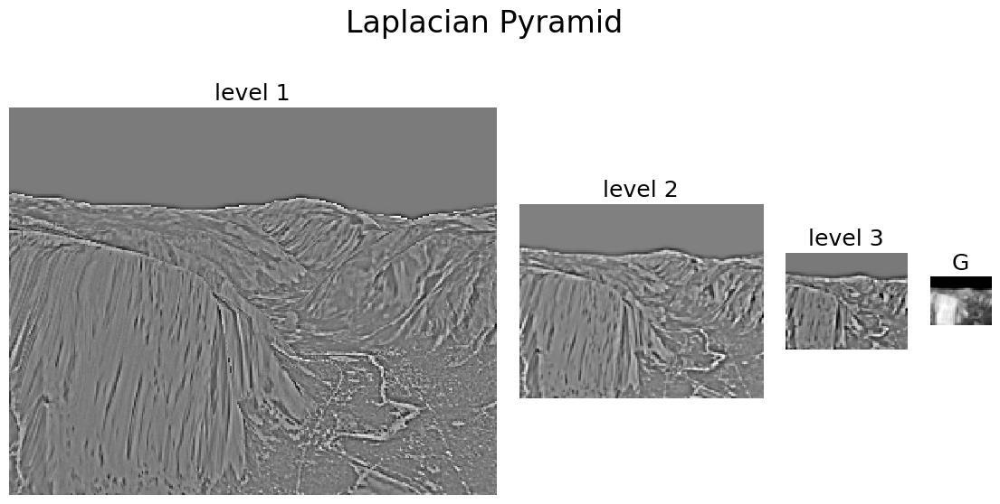

In [6]:
level = 4

fig = plt.figure()
fig.suptitle('Laplacian Pyramid', y =0.9)
gs = gridspec.GridSpec(1, level, width_ratios=[2**i for i in range(level)][::-1], wspace=0.1)

g = yos1

for i in range(level - 1):
    #laplacian pyramid
    l = g - expand(reduce(g), g.shape)
    ax = plt.subplot(gs[i])

    ax.set_title('level {}'.format(i + 1))
    ax.imshow(l, cmap='gray')
    ax.axis('off')
    g = reduce(g)

ax = plt.subplot(gs[-1])
ax.set_title('G')
ax.imshow(g, cmap='gray')
ax.axis('off')
plt.show()


## 2. Lucas Kanade optic flow

In [7]:
# load image
img1_u8 = cv.imread("ps5-descr\images\TestSeq\Shift0.png", cv.IMREAD_GRAYSCALE)
img1 = img1_u8.astype(float) / 255

In [8]:
def gradX(img):
    '''
    Calculate horizontal image gradient.
    '''
    # Horizonal Sobel
    grad_img = cv.Sobel(img, -1, 1, 0,ksize=1)
    return grad_img
    
def gradY(img):
    '''
    Calculate vertical image gradient.
    '''
    # Vertical Sobel
    grad_img = cv.Sobel(img, -1, 0, 1,ksize=1)
    return grad_img

### 2.1 LK optic flow estimation

In [9]:
# plot
#1. quiver plot
def plot_flow_quiver(u, v, ax, img, resolu = 5, title = 'flow field'):
    '''plot the flow field using quiver plot'''
    ax.imshow(img, cmap='gray')
    x = np.arange(0, img.shape[1], resolu)
    y = np.arange(0, img.shape[0], resolu)
    X, Y = np.meshgrid(x, y)
    ax.quiver(X, Y, u[::resolu, ::resolu], v[::resolu, ::resolu], color='r')
    ax.set_title(title)
    ax.axis('off')
    return


#2. dense plot
def plot_flow_dense(ax1, ax2, u, v):
    '''plot the flow field using dense plot'''
    flowmin = min(np.min(u), np.min(v))
    flowmax = max(np.max(u), np.max(v))
    ax1.imshow(u, cmap='jet', vmin=flowmin, vmax=flowmax)
    ax1.set_title('u')
    ax1.axis('off')

    ax2.imshow(v, cmap='jet', vmin=flowmin, vmax=flowmax)
    ax2.set_title('v')
    ax2.axis('off')
    return

#3. plot flow
def plot_flow(img, u, v, resolu = 5):
    '''plot quiver and dense plots.'''
    fig = plt.figure(figsize=(14, 8), constrained_layout=True)
    gs = gridspec.GridSpec(2, 2, width_ratios=[2, 1])

    # quiver plot
    ax1 = fig.add_subplot(gs[:, 0])
    plot_flow_quiver(u, v, ax1, img, resolu)

    # dense plot
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, 1])
    plot_flow_dense(ax2, ax3, u, v)
    return 

In [10]:
def lk_iter(img1, img2, blursize, window_size):
    '''perform one iteration of Lucas-Kanade algorithm'''
    # blur the image
    img1 = cv.GaussianBlur(img1, (blursize, blursize), 0)
    img2 = cv.GaussianBlur(img2, (blursize, blursize), 0)

    # compute gradient
    Ix = gradX(img1)
    Iy = gradY(img1)
    It = img2 - img1

    # compute 2nd moment matrix
    IxIx = cv.boxFilter(Ix*Ix, -1, ksize=(window_size, window_size), normalize=True)
    IxIy = cv.boxFilter(Ix*Iy, -1, ksize=(window_size, window_size), normalize=True)
    IyIy = cv.boxFilter(Iy*Iy, -1, ksize=(window_size, window_size), normalize=True)
    IxIt = cv.boxFilter(Ix*It, -1, ksize=(window_size, window_size), normalize=True)
    IyIt = cv.boxFilter(Iy*It, -1, ksize=(window_size, window_size), normalize=True)

    # compute flow
    u = np.zeros(img1.shape)
    v = np.zeros(img1.shape)
    for i in range(img1.shape[0]):
        for j in range(img1.shape[1]):
            A = np.array([[IxIx[i, j], IxIy[i, j]], [IxIy[i, j], IyIy[i, j]]])
            b = np.array([-IxIt[i, j], -IyIt[i, j]])
            if np.linalg.det(A) != 0:
                flow = np.linalg.inv(A) @ b
                u[i, j] = flow[0]
                v[i, j] = - flow[1]
    return u, v

#### a. motion between the base and ShiftR2 

d:\anaconda\Lib\site-packages\IPython\core\events.py:89: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  func(*args, **kwargs)
d:\anaconda\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


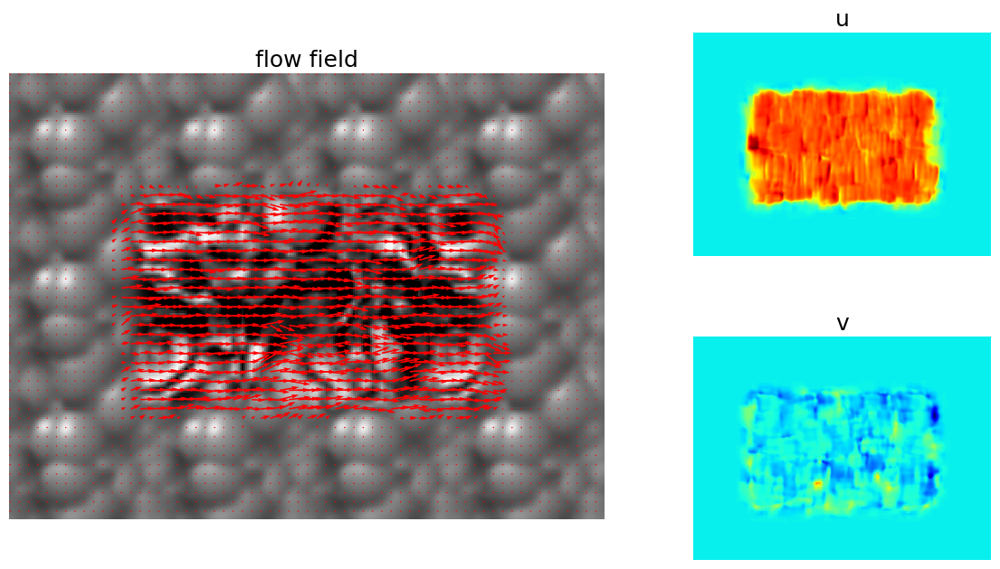

In [11]:
img2_u8 = cv.imread("ps5-descr\images\TestSeq\ShiftR2.png", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255

# plot
u, v = lk_iter(img1, img2, blursize=9, window_size=15)
plot_flow(img1, u, v)


An 9x9 Gaussian blurring kernel was used before optical flow estimation.

#### b. motion between the base and ShiftR5U5 

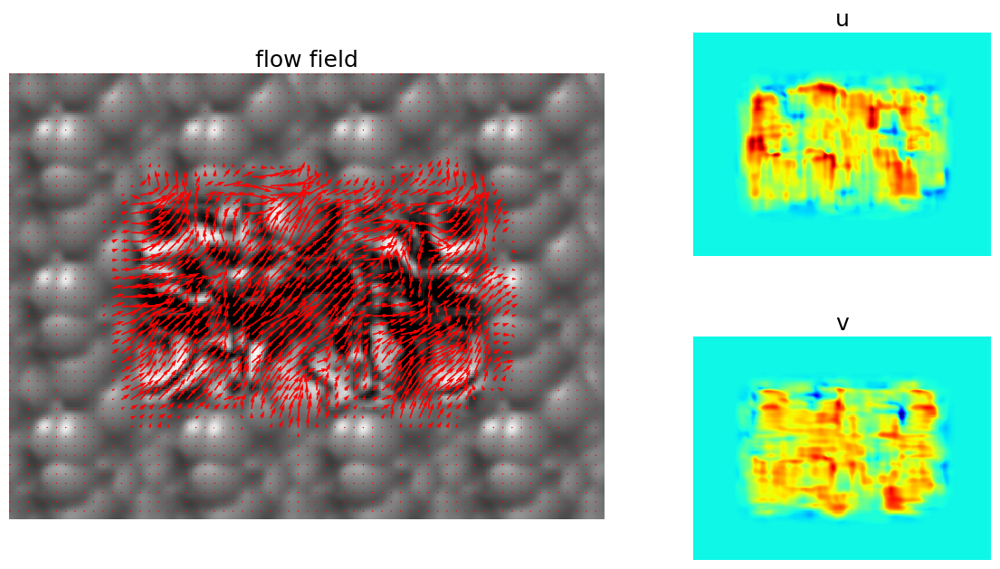

In [12]:
img2_u8 = cv.imread("ps5-descr\images\TestSeq\ShiftR5U5.png", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255

# plot
u, v = lk_iter(img1, img2, blursize=15, window_size=25)  
plot_flow(img1, u, v)


An 15x15 Gaussian blurring kernel was used before optical flow estimation.

### 2.2 Large Displacements
#### a. ShiftR10

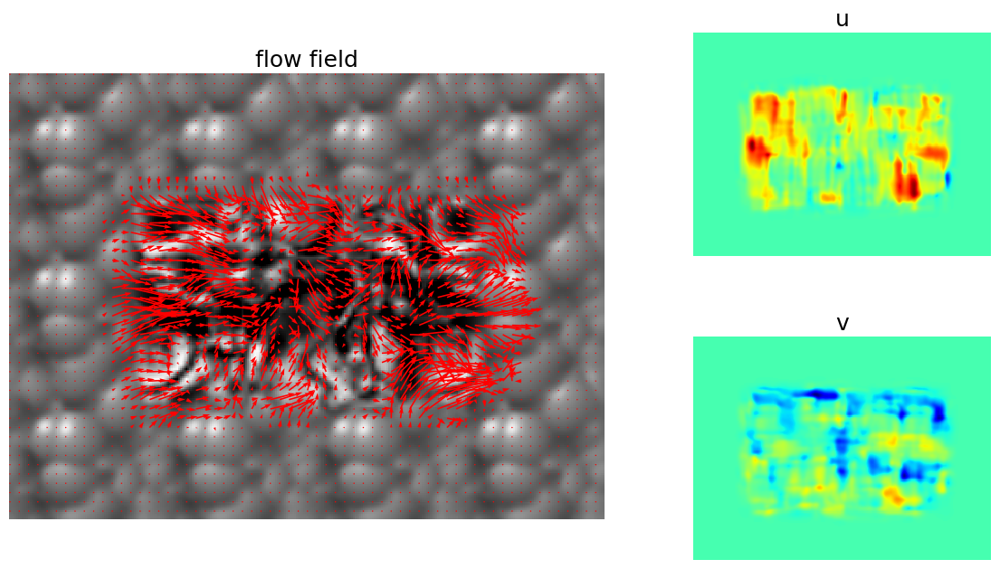

In [13]:
img2_u8 = cv.imread("ps5-descr\images\TestSeq\ShiftR10.png", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255

# plot
u, v = lk_iter(img1, img2, blursize=15, window_size=25)
plot_flow(img1, u, v)


#### b. ShiftR20

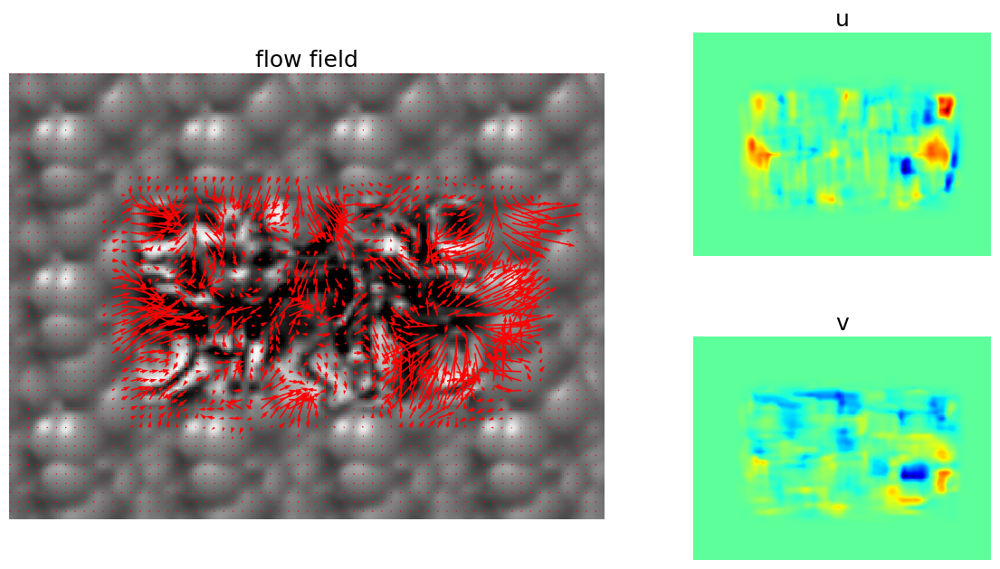

In [14]:
img2_u8 = cv.imread("ps5-descr\images\TestSeq\ShiftR20.png", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255

# plot
u, v = lk_iter(img1, img2, blursize=15, window_size=25)
plot_flow(img1, u, v)

#### c. ShiftR40

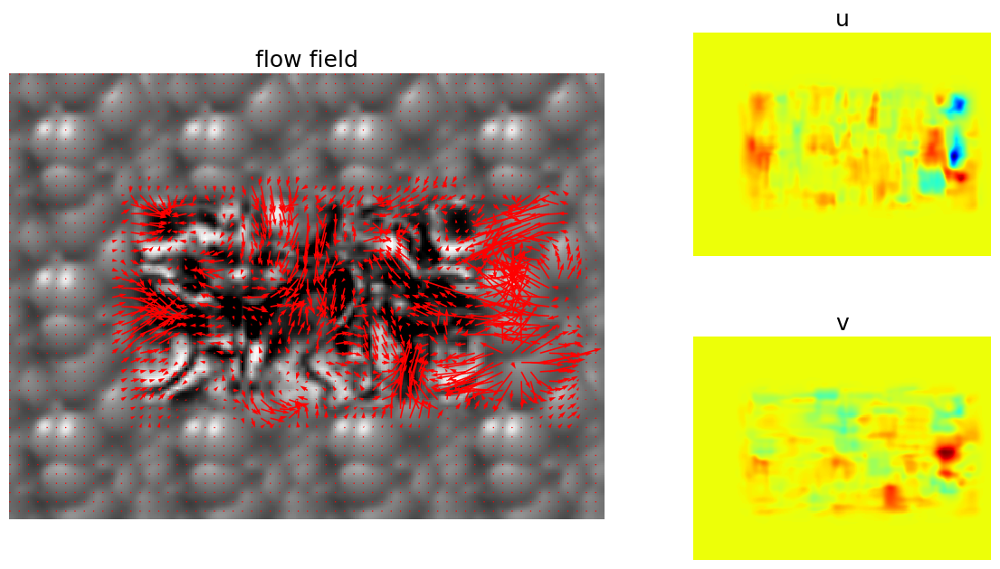

In [15]:
img2_u8 = cv.imread("ps5-descr\images\TestSeq\ShiftR40.png", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255

# plot
u, v = lk_iter(img1, img2, blursize=15, window_size=25)
plot_flow(img1, u, v)


The previous optical flow fails.

The fundamental assumptions of small displacement methods are that pixel intensities remain constant and that neighboring pixels have similar motion. Large motions can break these assumptions due to rapid changes in intensity and non-linear motion in the field of view.

### 2.3 Warping

In [16]:
def warp(img, u, v):
    '''warp the image using flow field'''
    # create meshgrid
    x = np.arange(0, img.shape[1])
    y = np.arange(0, img.shape[0])
    X, Y = np.meshgrid(x, y)

    # warp the image
    warped_img = cv.remap(img, (X + u).astype(np.float32), (Y + v).astype(np.float32), cv.INTER_LINEAR)
    return warped_img

#### a. DataSeq 1

In [17]:
img1_u8 = cv.imread("ps5-descr\images\DataSeq1\yos_img_01.jpg", cv.IMREAD_GRAYSCALE)
img1 = img1_u8.astype(float) / 255
img2_u8 = cv.imread("ps5-descr\images\DataSeq1\yos_img_02.jpg", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255

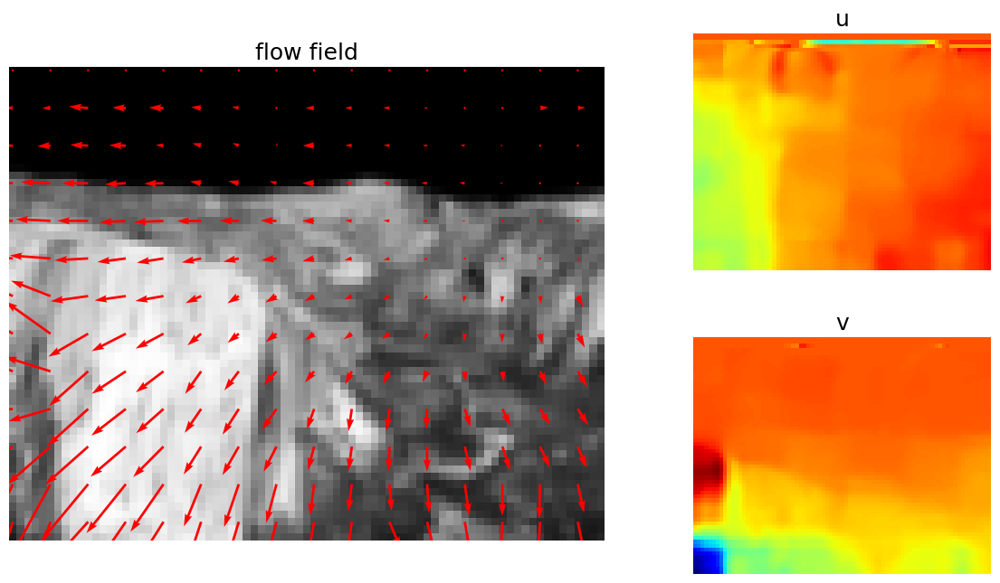

In [18]:
# use a lower pyramid level
level = 2
img1r = reduce(img1, level)
img2r = reduce(img2, level)

u, v = lk_iter(img1r, img2r, blursize=9, window_size=15)
plot_flow(img1r, u, v)

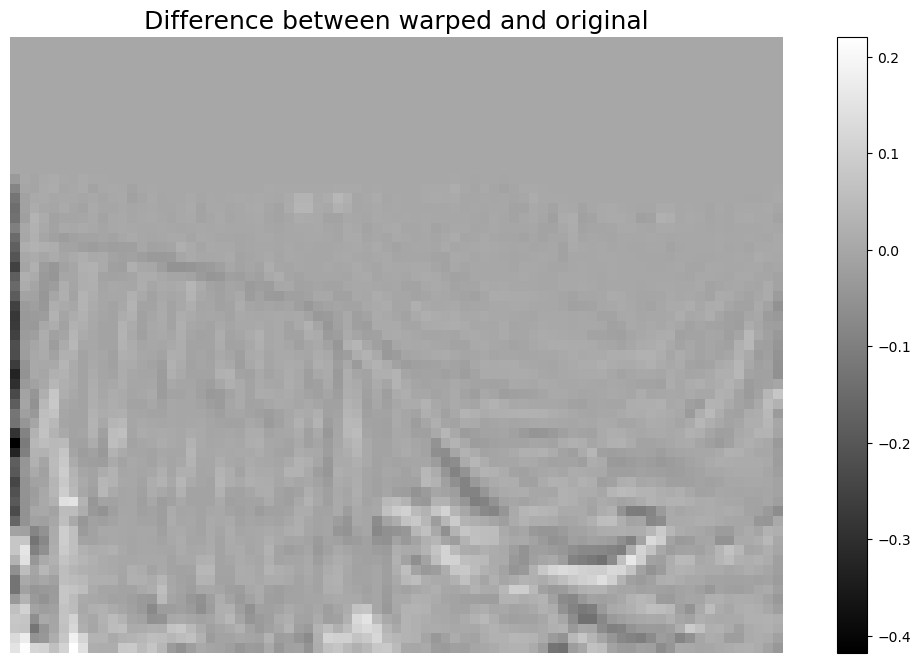

In [19]:
# warp the image
warped_img = warp(img2r, u, v)

# plot
plt.imshow(warped_img - img1r)
plt.colorbar()
plt.title('Difference between warped and original');


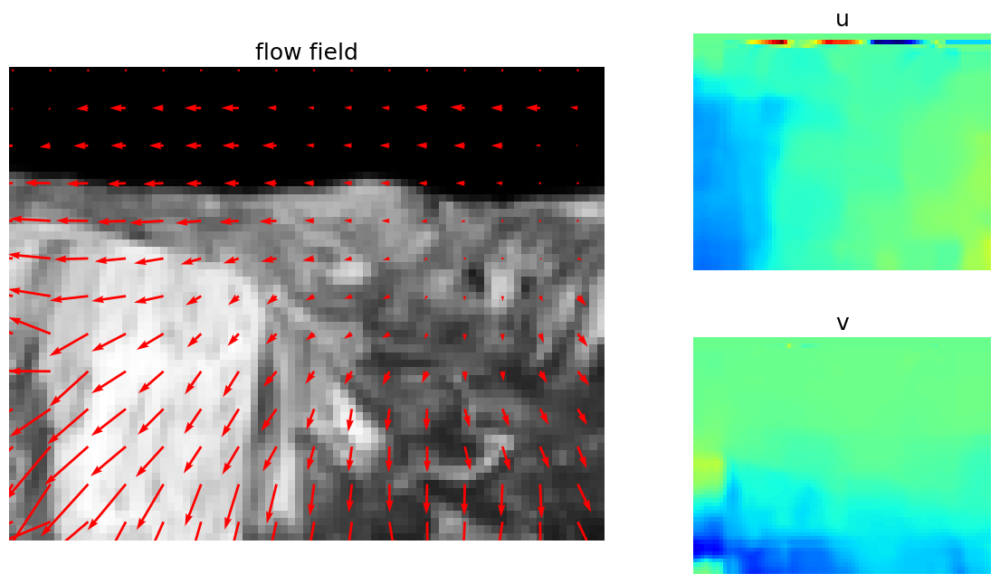

In [20]:
# load image
img3_u8 = cv.imread("ps5-descr\images\DataSeq1\yos_img_03.jpg", cv.IMREAD_GRAYSCALE)
img3 = img3_u8.astype(float) / 255

# use a lower pyramid level
level = 2
img3r = reduce(img3, level)

u, v = lk_iter(img2r, img3r, blursize=9, window_size=15)
plot_flow(img2r, u, v)

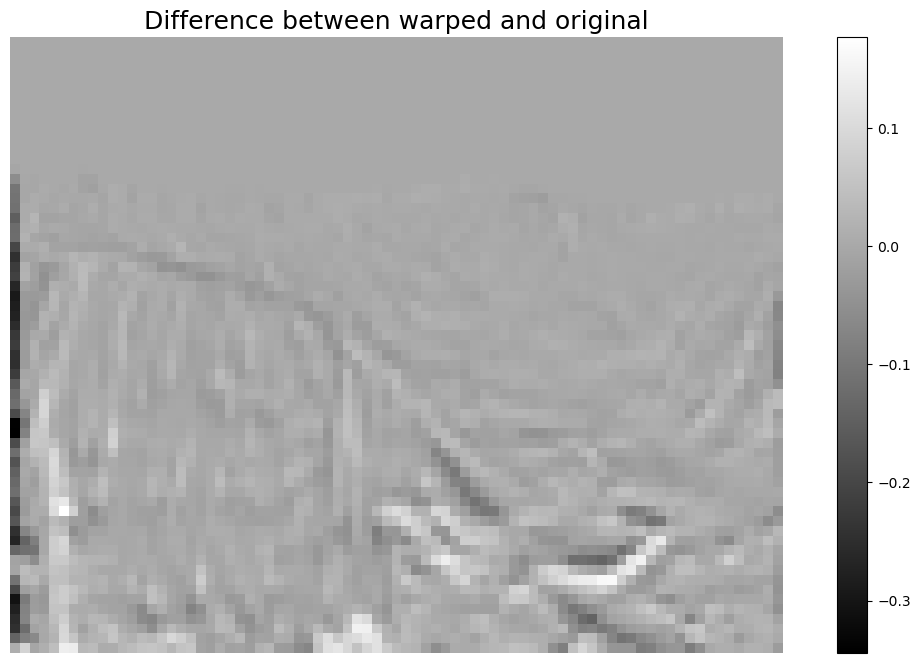

In [21]:
#warped image
warped_img = warp(img3r, u, v)

# plot
plt.imshow(warped_img - img2r)
plt.colorbar()
plt.title('Difference between warped and original');

#### b. DataSeq2

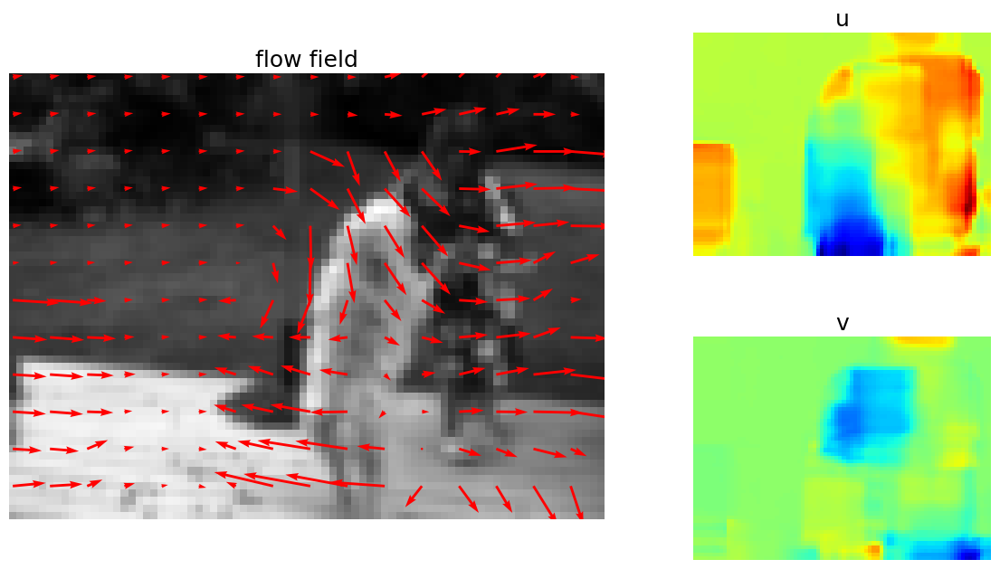

In [22]:
# load image
img4_u8 = cv.imread("ps5-descr\images\DataSeq2/0.png", cv.IMREAD_GRAYSCALE)
img4 = img4_u8.astype(float) / 255
img5_u8 = cv.imread("ps5-descr\images\DataSeq2/1.png", cv.IMREAD_GRAYSCALE)
img5 = img5_u8.astype(float) / 255

# use a lower pyramid level
level = 3
img4r = reduce(img4, level)
img5r = reduce(img5, level)

u, v = lk_iter(img4r, img5r, blursize=3, window_size=17)
plot_flow(img4r, u, v)

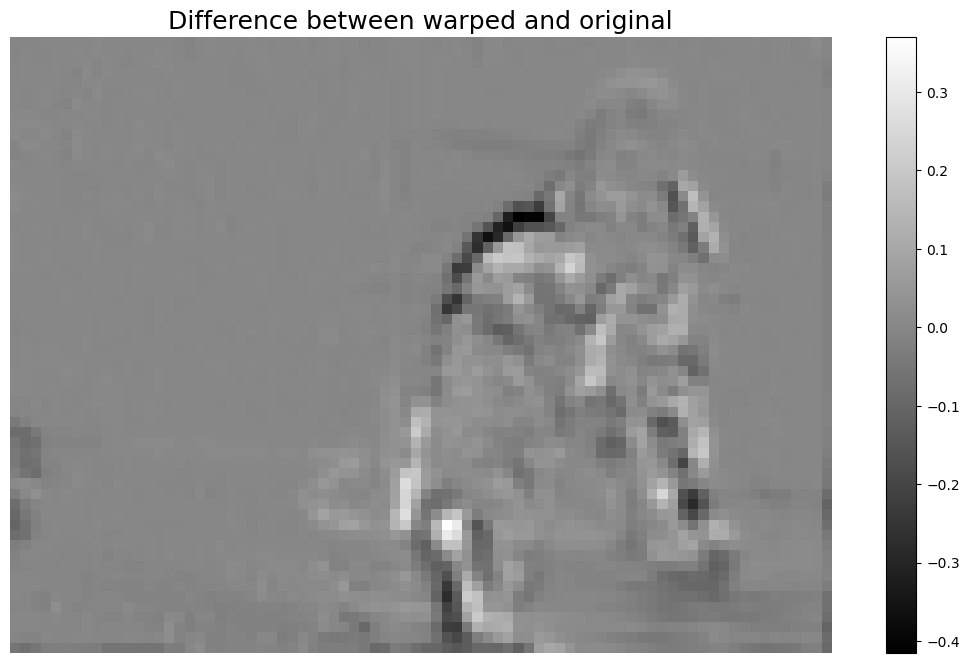

In [23]:
# warped image
warped_img = warp(img5r, u, v)

# plot
plt.imshow(warped_img - img4r)
plt.colorbar()
plt.title('Difference between warped and original');

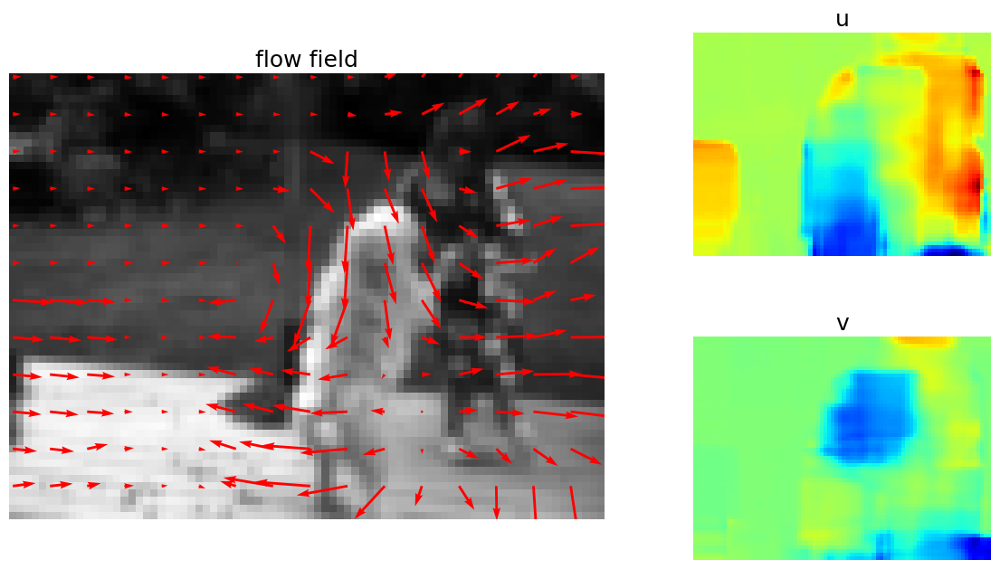

In [24]:
# load image
img6_u8 = cv.imread("ps5-descr\images\DataSeq2/2.png", cv.IMREAD_GRAYSCALE)
img6 = img6_u8.astype(float) / 255

# use a lower pyramid level
level = 3
img6r = reduce(img6, level)

u, v = lk_iter(img5r, img6r, blursize=3, window_size=17)
plot_flow(img5r, u, v)


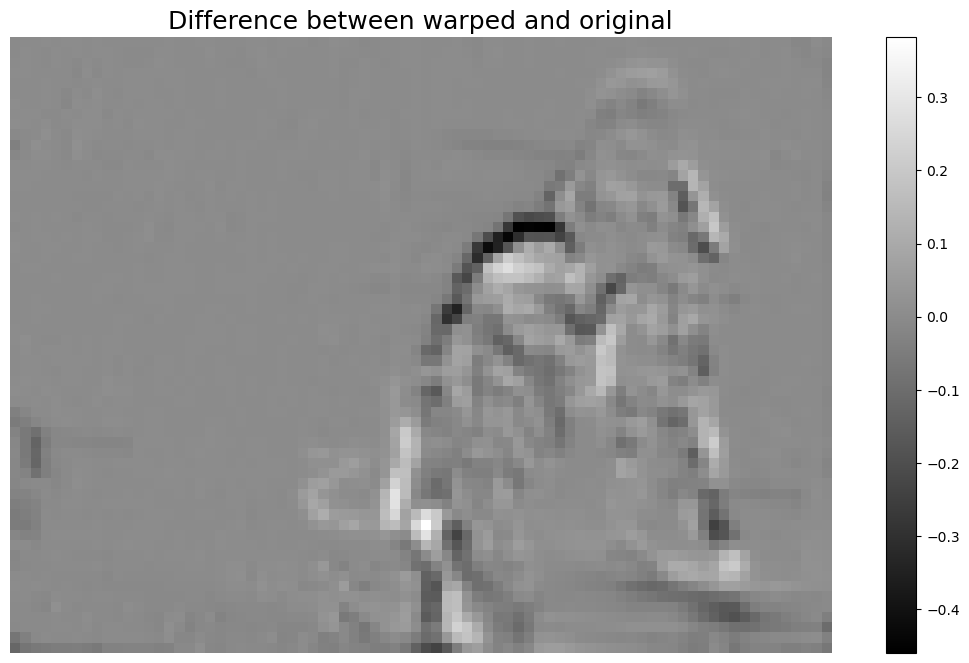

In [25]:
#warp the image
warped_img = warp(img6r, u, v)

# plot
plt.imshow(warped_img - img5r)
plt.colorbar()
plt.title('Difference between warped and original');

## 3. Hierarchical LK optic flow

In [26]:

# def hierarchical_lk(img1, img2, levels, blursize, window_size):
#     '''hierarchical Lucas-Kanade algorithm'''
#     # create image pyramids
#     pyramid1 = [img1]
#     pyramid2 = [img2]
#     for i in range(levels):
#         pyramid1.append(reduce(pyramid1[i]))
#         pyramid2.append(reduce(pyramid2[i]))

#     # initialize flow at the coarsest level
#     u = np.zeros(pyramid1[-1].shape)
#     v = np.zeros(pyramid2[-1].shape)

#     # iterate from the top of the pyramid to the bottom
#     for level in range(levels, -1, -1):
#         # scale the flow up to the next level
#         if level < levels:
#             u = expand(u, pyramid1[level].shape)
#             v = expand(v, pyramid1[level].shape)

#         # warp the second image at this level
#         warped_img2 = warp(pyramid2[level], u, v)

#         # perform Lucas-Kanade iteration at this level
#         u_level, v_level = lk_iter(pyramid1[level], warped_img2, blursize, window_size)

#         # update the flow based on this level's estimate
#         u += u_level
#         v += v_level

#     # return the flow estimates at the original image scale
#     return u, v


In [27]:
def hierarchical_lk(img1, img2, levels, blursize, window_size):
    '''hierarchical Lucas-Kanade algorithm'''
    # Create image pyramids for both images
    pyramid1 = [reduce(img, level) for level in range(levels) for img in [img1]][::-1]
    pyramid2 = [reduce(img, level) for level in range(levels) for img in [img2]][::-1]

    # Initialize flow at the coarsest level (top of the pyramid)
    u = np.zeros(pyramid1[0].shape)
    v = np.zeros(pyramid2[0].shape)

    # Iterate from the top of the pyramid to the bottom
    for level in range(levels):
        
        if level != 0: # Skip the first level
            u = 2 * expand(u, dstsize=pyramid1[level].shape)
            v = 2 * expand(v, dstsize=pyramid2[level].shape)

        # Warp the second image at this level by the current flow estimate
        warped_img2 = warp(pyramid2[level], u, v)

        # Perform Lucas-Kanade iteration at this level
        u_level, v_level = lk_iter(pyramid1[level], warped_img2, blursize, window_size)

        # Update the flow based on this level's estimate
        u += u_level
        v += v_level

    return u, v

#### a.TestSeq

In [28]:
img1_u8 = cv.imread("ps5-descr\images\TestSeq\Shift0.png", cv.IMREAD_GRAYSCALE)
img1 = img1_u8.astype(float) / 255

##### ShiftR10

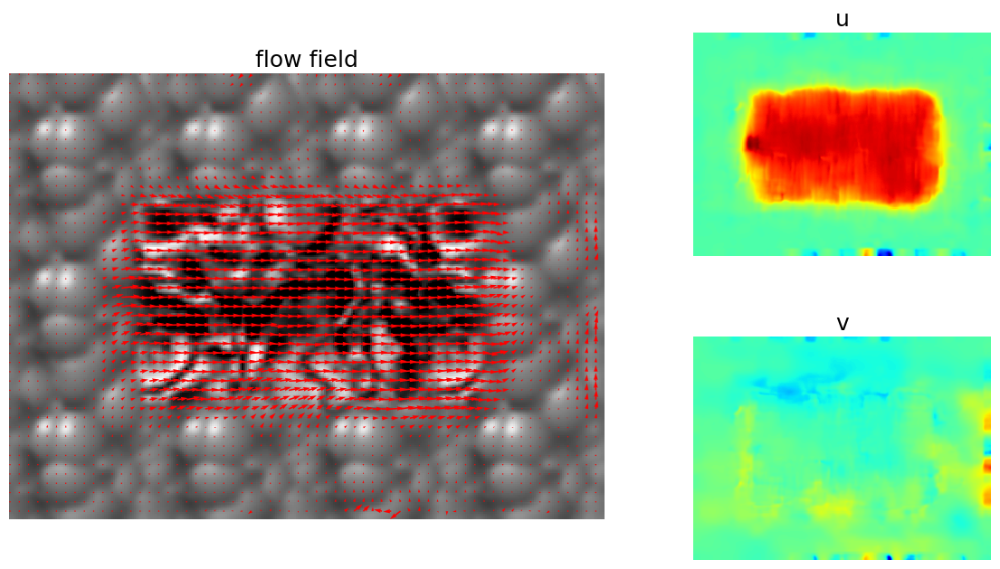

In [29]:
img2_u8 = cv.imread("ps5-descr\images\TestSeq\ShiftR10.png", cv.IMREAD_GRAYSCALE)    
img2 = img2_u8.astype(float) / 255

u, v = hierarchical_lk(img1, img2, levels=4, blursize=5, window_size=15)
plot_flow(img1, u, v)


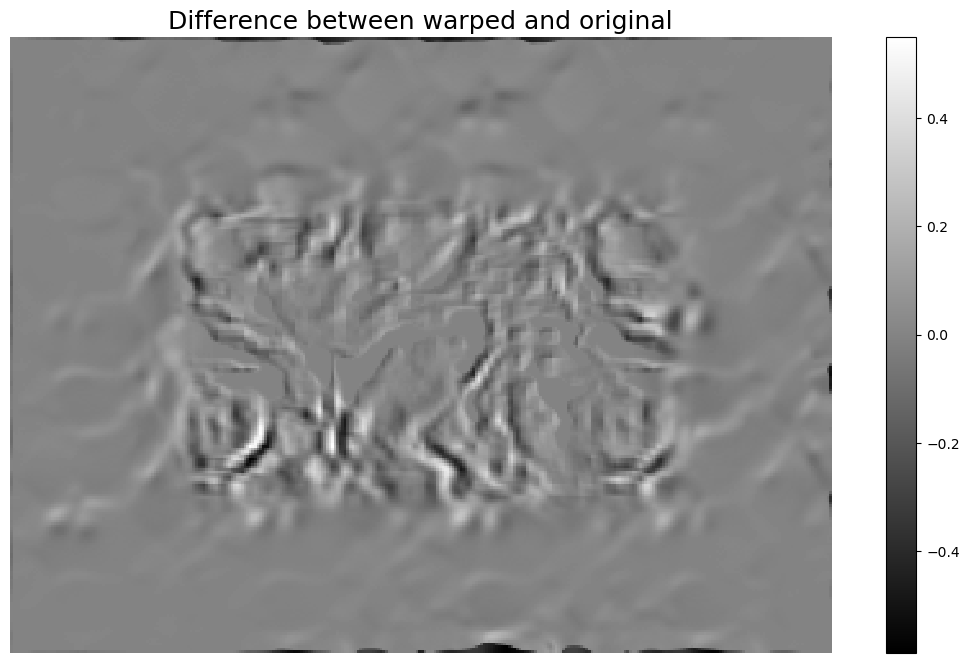

In [30]:
# Warp the second image
warped_img2 = warp(img2, u, v)

# Plot the difference between the warped image and the first image
plt.imshow(warped_img2 - img1)
plt.colorbar()
plt.title('Difference between warped and original');

##### ShiftR20

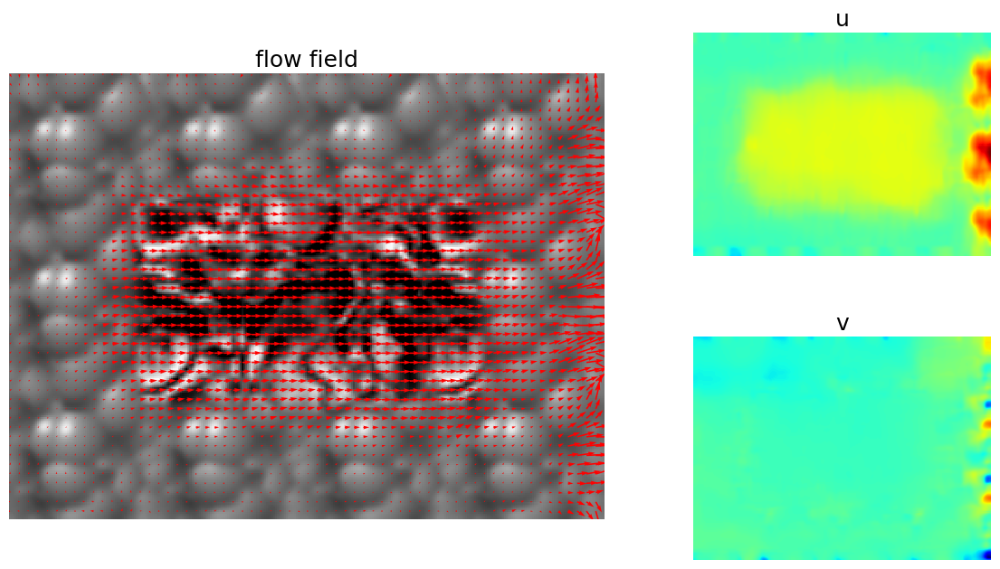

In [31]:
img2_u8 = cv.imread("ps5-descr\images\TestSeq\ShiftR20.png", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255

u, v = hierarchical_lk(img1, img2, levels=5, blursize=9, window_size=20)
plot_flow(img1, u, v)

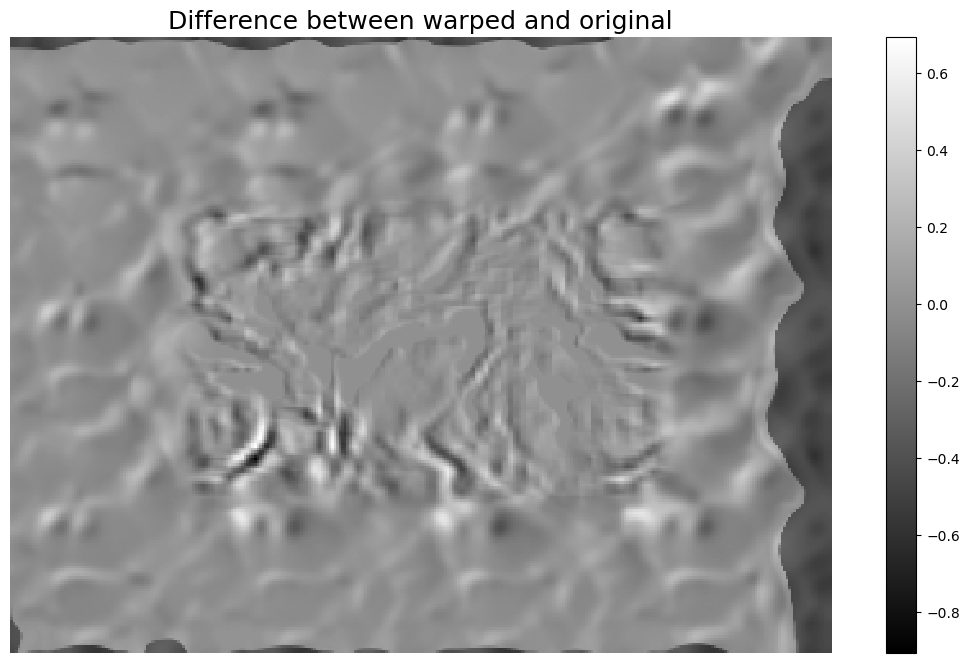

In [32]:
# Warp the second image
warped_img2 = warp(img2, u, v)

# Plot the difference between the warped image and the first image
plt.imshow(warped_img2 - img1)
plt.colorbar()
plt.title('Difference between warped and original');


##### ShiftR40

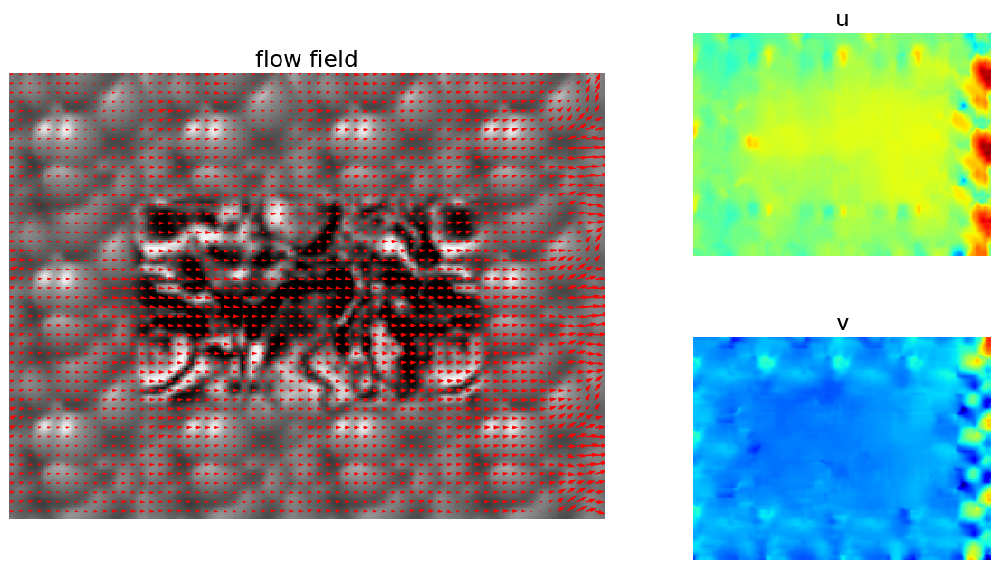

In [33]:
img2_u8 = cv.imread("ps5-descr\images\TestSeq\ShiftR40.png", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255

u, v = hierarchical_lk(img1, img2, levels=6, blursize=5, window_size=15)
plot_flow(img1, u, v)

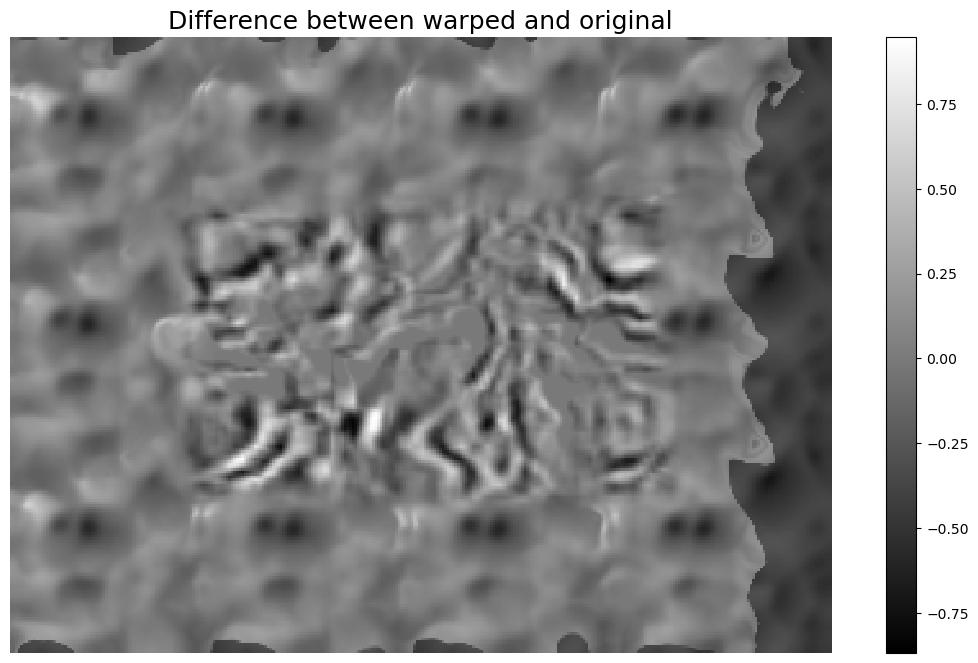

In [34]:
# Warp the second image
warped_img2 = warp(img2, u, v)

# Plot the difference between the warped image and the first image
plt.imshow(warped_img2 - img1)
plt.colorbar()
plt.title('Difference between warped and original');

#### b. DataSeq1

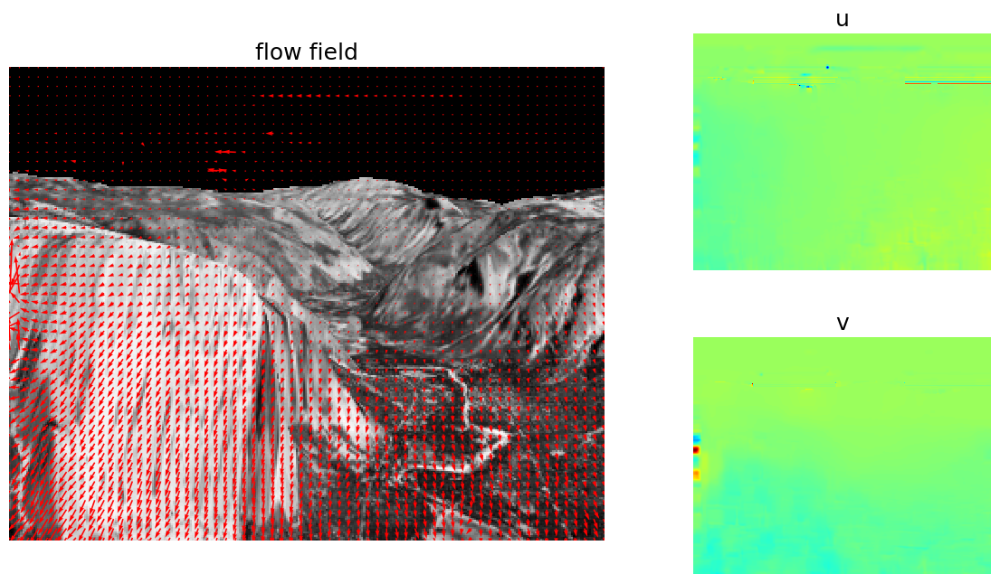

In [35]:
# load image
img1_u8 = cv.imread("ps5-descr\images\DataSeq1\yos_img_01.jpg", cv.IMREAD_GRAYSCALE)
img1 = img1_u8.astype(float) / 255
img2_u8 = cv.imread("ps5-descr\images\DataSeq1\yos_img_02.jpg", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255
img3_u8 = cv.imread("ps5-descr\images\DataSeq1\yos_img_03.jpg", cv.IMREAD_GRAYSCALE)
img3 = img3_u8.astype(float) / 255

u, v = hierarchical_lk(img1, img2, levels=3, blursize=5, window_size=15)
plot_flow(img1, u, v)


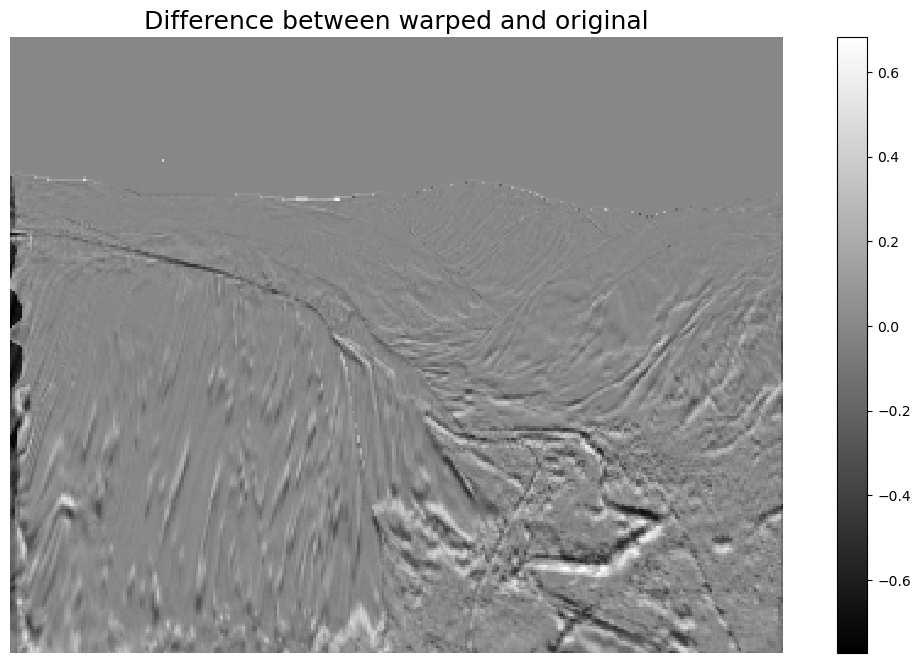

In [36]:
# Warp the second image
warped_img2 = warp(img2, u, v)

# Plot the difference between the warped image and the first image
plt.imshow(warped_img2 - img1)
plt.colorbar()
plt.title('Difference between warped and original');

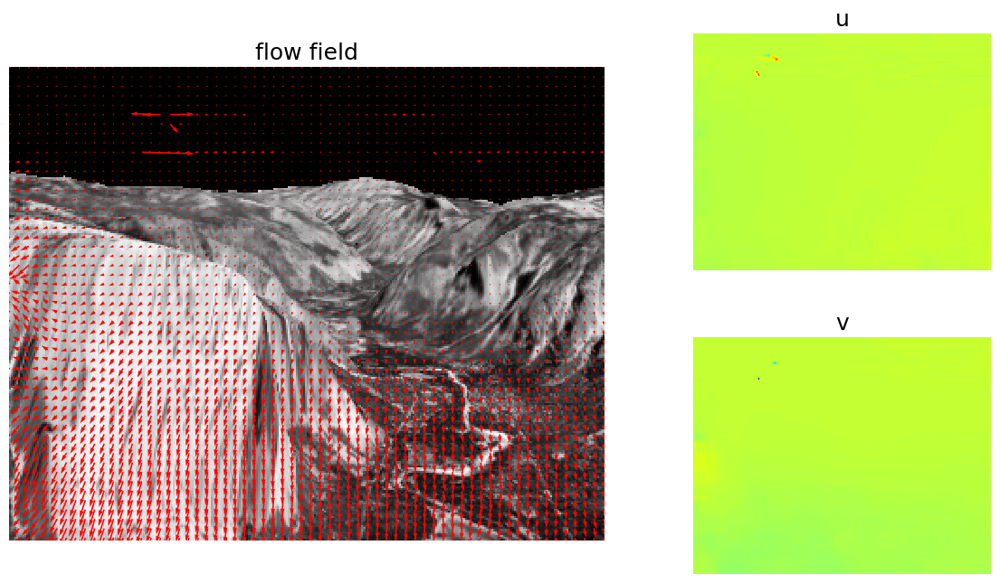

In [37]:
u, v = hierarchical_lk(img2, img3, levels=4, blursize=7, window_size=25)
plot_flow(img2, u, v)

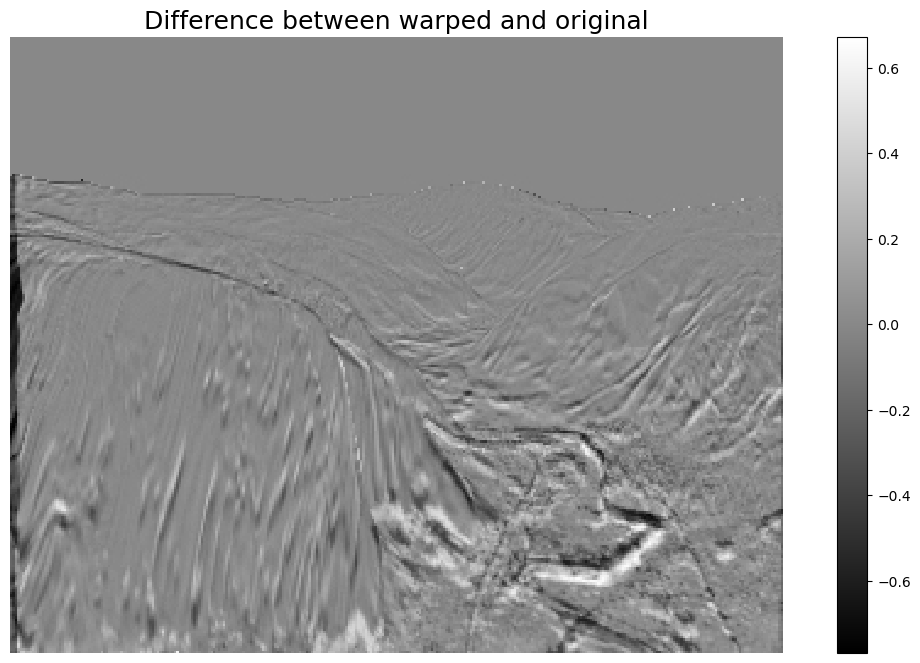

In [38]:
# Warp the third image
warped_img3 = warp(img3, u, v)

# Plot the difference between the warped image and the second image
plt.imshow(warped_img3 - img2)
plt.colorbar()
plt.title('Difference between warped and original');

#### c.DataSeq2

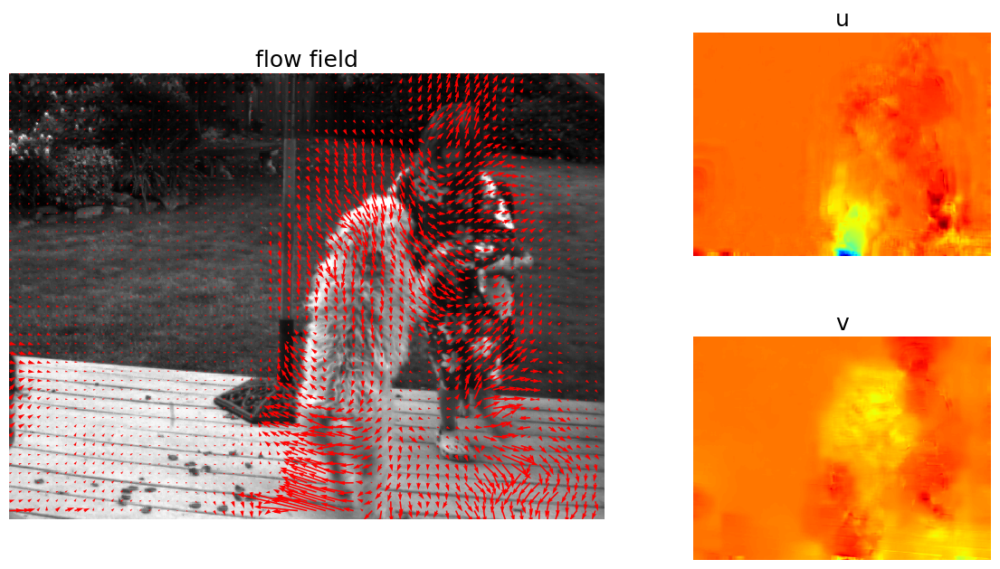

In [39]:
# load image
img4_u8 = cv.imread("ps5-descr\images\DataSeq2/0.png", cv.IMREAD_GRAYSCALE)
img4 = img4_u8.astype(float) / 255
img5_u8 = cv.imread("ps5-descr\images\DataSeq2/1.png", cv.IMREAD_GRAYSCALE)
img5 = img5_u8.astype(float) / 255
img6_u8 = cv.imread("ps5-descr\images\DataSeq2/2.png", cv.IMREAD_GRAYSCALE)
img6 = img6_u8.astype(float) / 255 

u, v = hierarchical_lk(img4, img5, levels=4, blursize=3, window_size=15)
plot_flow(img4, u, v, resolu=10)

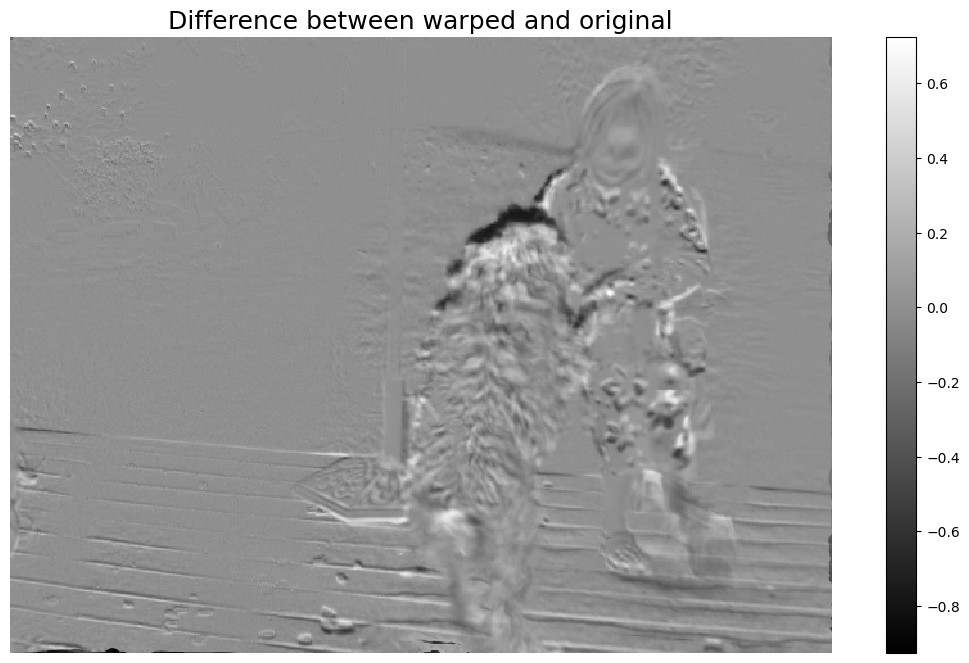

In [40]:
# Warp the second image
warped_img5 = warp(img5, u, v)

# Plot the difference between the warped image and the first image
plt.imshow(warped_img5 - img4)
plt.colorbar()
plt.title('Difference between warped and original');

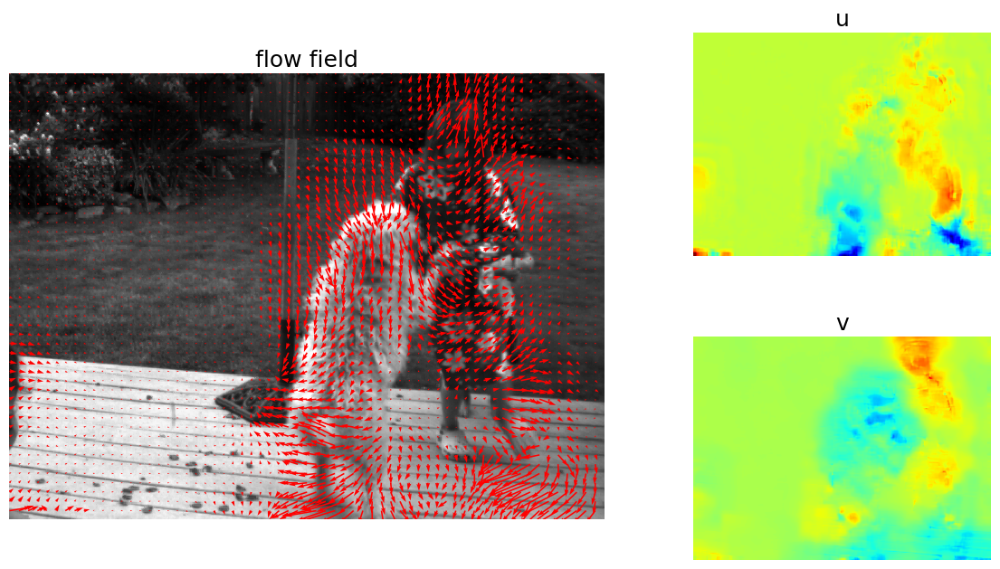

In [41]:
u, v = hierarchical_lk(img5, img6, levels=4, blursize=3, window_size=15)
plot_flow(img5, u, v, resolu=10)

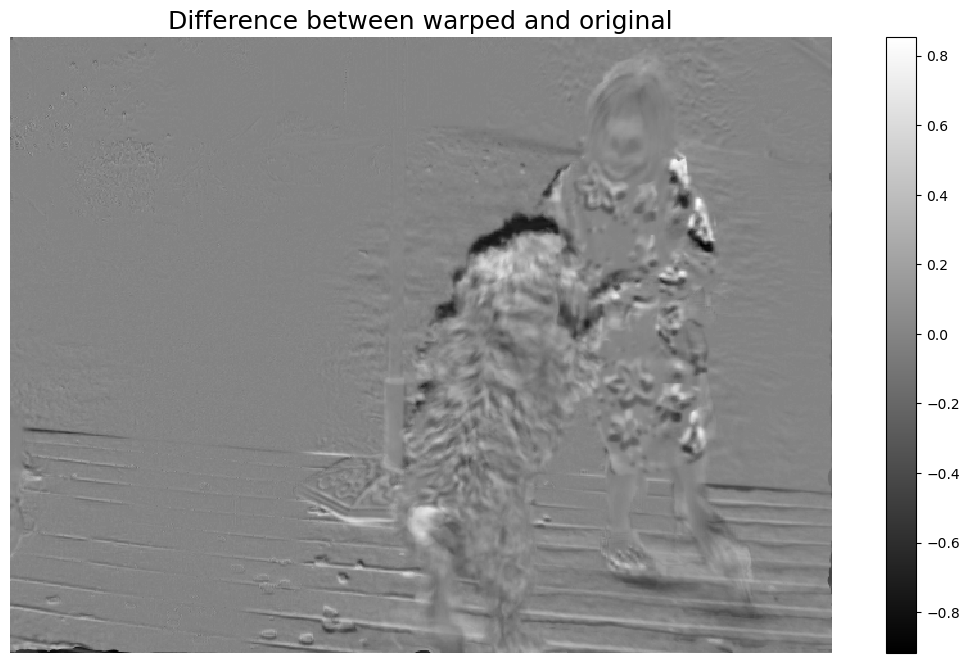

In [42]:
# Warp the third image
warped_img6 = warp(img6, u, v)

# Plot the difference between the warped image and the second image
plt.imshow(warped_img6 - img5)
plt.colorbar()
plt.title('Difference between warped and original');


## 4. The Juggle Sequence

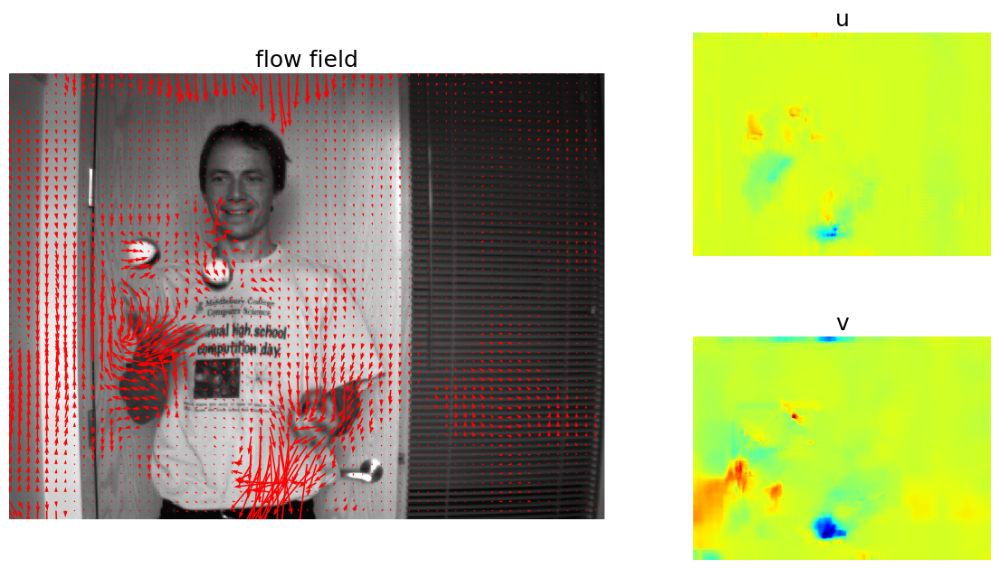

In [43]:
# load image
img1_u8 = cv.imread("ps5-descr\images\Juggle/0.png", cv.IMREAD_GRAYSCALE)
img1 = img1_u8.astype(float) / 255
img2_u8 = cv.imread("ps5-descr\images\Juggle/1.png", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255
img3_u8 = cv.imread("ps5-descr\images\Juggle/2.png", cv.IMREAD_GRAYSCALE)
img3 = img3_u8.astype(float) / 255

u, v = hierarchical_lk(img1, img2, levels=3, blursize=5, window_size=21)
plot_flow(img1, u, v, resolu=10)

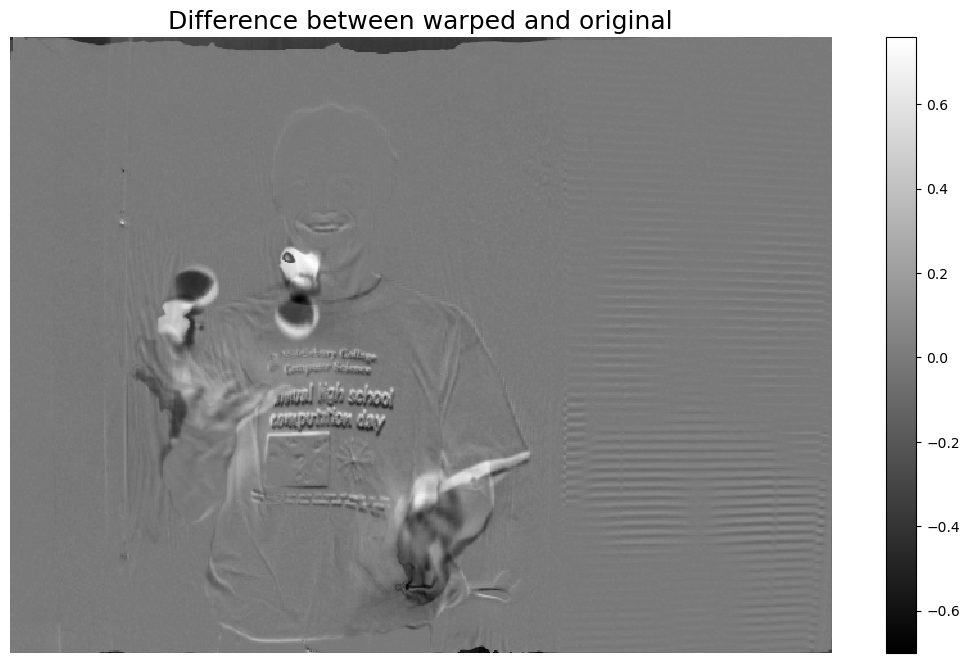

In [44]:
#warp the second image
warped_img2 = warp(img2, u, v)

# plot
plt.imshow(warped_img2 - img1)
plt.colorbar()
plt.title('Difference between warped and original');

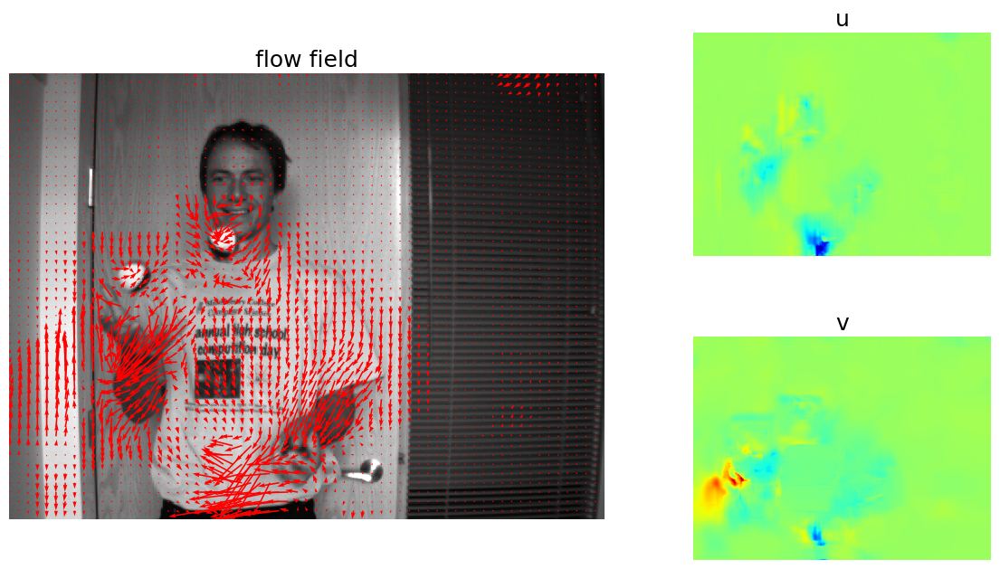

In [45]:
u,v = hierarchical_lk(img2, img3, levels=3, blursize=5, window_size=21)
plot_flow(img2, u, v, resolu=10)

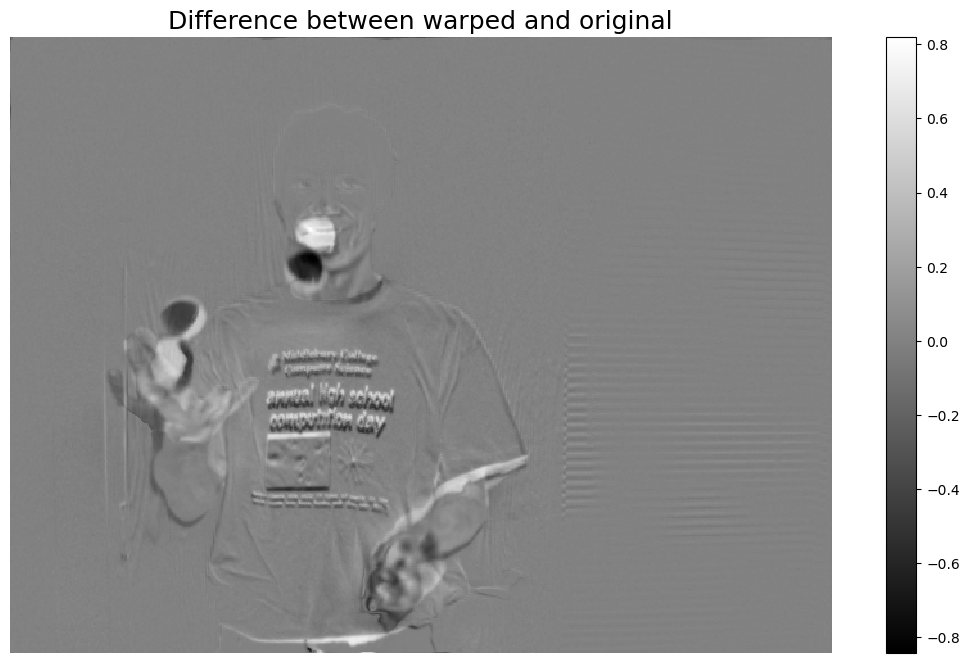

In [46]:
# warp the third image
warped_img3 = warp(img3, u, v)

# plot
plt.imshow(warped_img3 - img2)
plt.colorbar()
plt.title('Difference between warped and original');


## 5. The Taxi Sequence

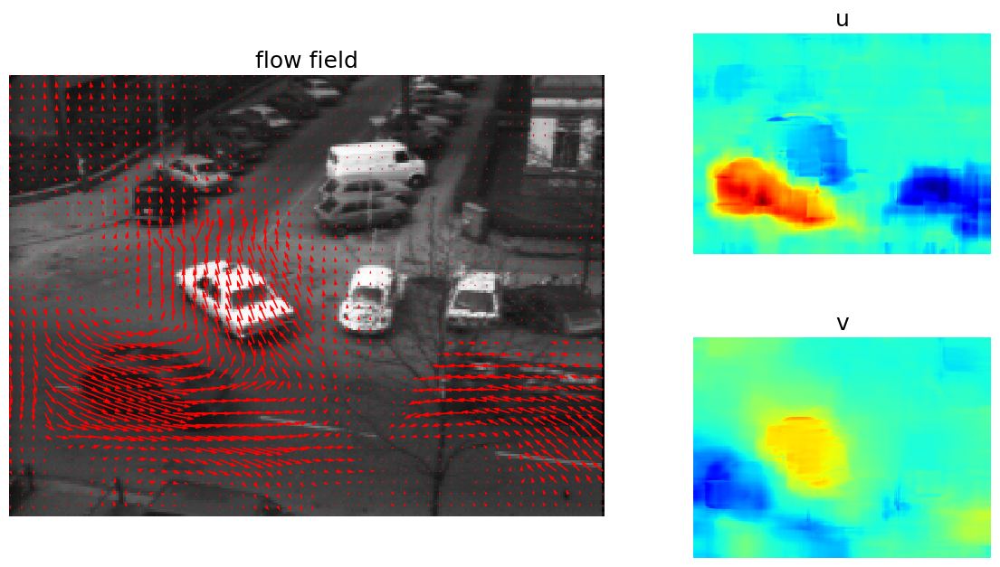

In [47]:
# load image
img1_u8 = cv.imread("ps5-descr\images\Taxis/taxi-18.tif", cv.IMREAD_GRAYSCALE)
img1 = img1_u8.astype(float) / 255
img2_u8 = cv.imread("ps5-descr\images\Taxis/taxi-19.tif", cv.IMREAD_GRAYSCALE)
img2 = img2_u8.astype(float) / 255

u, v = hierarchical_lk(img1, img2, levels=5, blursize=3, window_size=20)
plot_flow(img1, u, v)

d:\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
d:\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid i

(-0.5, 255.5, 189.5, -0.5)

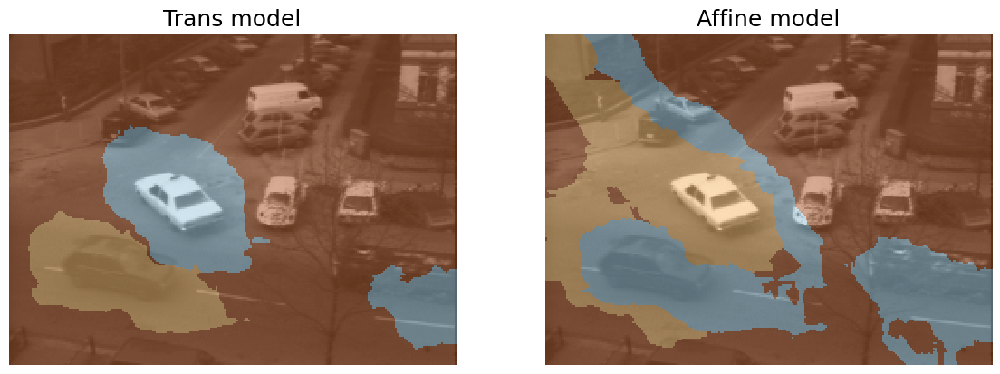

In [53]:
def fit_motion_model(u, v, labels, thresh, model):
    '''estimate the motion model'''
    if model == 'trans':
        a = np.zeros((1, 2))
    elif model == 'affine':
        a = np.zeros((1, 6))
    else:
        raise ValueError('Unknown motion model')
    
    h, w = u.shape
    y, x = np.mgrid[:h, :w]
    #number of layers
    n = np.max(labels) + 1

    #get the flow for each layer
    for i in range(n):
        mask = labels == i  # mask for this layer
        if np.count_nonzero(mask) > 3:
            ub = u[mask].flatten()
            vb = v[mask].flatten()
            xb = x[mask].flatten()
            yb = y[mask].flatten()
            nelems = np.count_nonzero(mask)
            if model == 'trans':
                a1 = np.mean(ub)
                a2 = np.mean(vb)
                aij = np.array([[a1, a2]])
                resdavg = np.var(ub) + np.var(vb)
            else:
                Ad = np.stack((xb, yb, np.ones(nelems)), axis=-1)
                A = block_diag(Ad, Ad)
                b = np.hstack((ub, vb))
                aij, resd = np.linalg.lstsq(A, b, rcond=None)[:2]
                resdavg = resd.item() / nelems
            if resdavg < thresh:
                a = np.vstack([a, aij])
    return a


def assign_labels(u, v, motions, thresh, model):
    h, w = u.shape
    resd = np.zeros((h, w, len(motions)))

    # compute the residual for each motion model
    for ix, a in enumerate(motions):
        if model == 'trans':
            u_, v_ = a
        else:
            y, x = np.mgrid[:h, :w]
            a1, a2, a3, a4, a5, a6 = a
            u_ = a1 * x + a2 * y + a3
            v_ = a4 * x + a5 * y + a6
        resd[:, :, ix] = np.abs(u - u_) + np.abs(v - v_)

    # assign labels
    segm = resd.argmin(-1)
    segm[resd.min(-1) > thresh] = -1
    return segm

def segment(u, v, iter = 100, bsize =32, model = 'trans'):
    h, w = u.shape
    y, x = np.mgrid[:h, :w]
    # initialize labels
    nx = w//bsize
    labels = nx * (y // bsize) + (x // bsize)

    # iterate
    for i in range(iter):
        # estimate motion model
        motions = fit_motion_model(u, v, labels, thresh=10, model=model)
        kmeans = KMeans(n_clusters=3, random_state=0).fit(motions)
        motions = kmeans.cluster_centers_
        # assign labels
        labels = assign_labels(u, v, motions, thresh=10, model=model)
    return labels, motions

# plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 8))
segmtrans, _ = segment(u, v, model = 'trans')
segmaffine, _ = segment(u, v, model = 'affine')
cmap = plt.get_cmap('Paired', np.max(segmaffine)-np.min(segmaffine)+1)

ax1.imshow(img1)
ax1.imshow(segmtrans, cmap=cmap, alpha=0.5)
ax1.set_title('Trans model')
ax1.axis('off')

ax2.imshow(img1)
ax2.imshow(segmaffine, cmap=cmap, alpha=0.5)
ax2.set_title('Affine model')
ax2.axis('off')